<a href="https://colab.research.google.com/github/AneeshCEN/DS-Challenge/blob/main/EDA_Modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DATASET OVERVIEW

---



The data is related to direct marketing campaigns (phone calls) of a banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be subscribed ('yes') or not ('no') subscribed by the customer or not.

The atributes present in the data are


1. age (numerical)
2. job: type of job (categorical)
3. marital: marital status (categorical: "married", "divorced", "single"; note: "divorced" means divorced or widowed)
4. education (categorical)
5. default: has credit in default? (categorical: "yes", "no")
6. housing: has housing loan? (categorical: "yes", "no")
7. loan: has personal loan? (categorical: "yes", "no")
8. contact: contact communication type (categorical: "unknown", "telephone", "cellular")
9. month: last contact month of year (categorical: "jan", "feb", "mar", …, "nov", "dec")
9. day_of_week: last contact day of the month (numerical)
10. duration: last contact duration, in seconds (numerical)
11. campaign: number of contacts performed during this campaign and for this client; includes last contact (numerical)
12. pdays: number of days that passed by after the client was last contacted from a previous campaign; 999 means client was not previously contacted (numerical)
13. previous: number of contacts performed before this campaign and for this client (numerical)
14. poutcome: outcome of the previous marketing campaign (categorical: "unknown", "other", "failure", "success").
15. y (TARGET) - has the client subscribed a term deposit? (categorical: "yes", "no")

DESCRIPTION OF THE TASKS

---

*   DATA CLEANING (check missing data, duplicated recods, verify data types, etc)
*   EXPLORATORY DATA ANALYSIS (Numerical and categorical analysis, class imbalance check, etc)
*   Model training
*   Model evaluation
*   Features importance calculation
*   Model Predictions with feature Importance
*   Summary







In [3]:
# Load all the necessary libraries
import shap
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from sklearn import preprocessing
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [4]:
# read the data
df = pd.read_csv('bank-additional-full.csv')

In [5]:
print("shape of the data:", df.shape)
df.head()

shape of the data: (41188, 21)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


***DATA CLEANING***

In [6]:
#From the documentation https://archive.ics.uci.edu/dataset/222/bank+marketing

# There is no clairity on what these columns indicates . So I am dropping those
drop_cols = ['emp.var.rate'	,'cons.price.idx',	'cons.conf.idx'	,'euribor3m'	,'nr.employed']

df = df.drop(columns=drop_cols)

**Check missing data**

Addressing missing data is a crucial aspect of data preprocessing, involving the management of observations absent in columns due to factors like data acquisition issues, insufficient information, or incomplete results. Introducing missing data into your machine learning model may result in inaccurate predictions or classifications. Therefore, it is essential to detect and handle missing values to ensure the reliability of the model.

In [7]:
df.isnull().sum()

age            0
job            0
marital        0
education      0
default        0
housing        0
loan           0
contact        0
month          0
day_of_week    0
duration       0
campaign       0
pdays          0
previous       0
poutcome       0
y              0
dtype: int64

**There are no missing values**


**Checking for duplicated entries**

In [8]:
df.duplicated().value_counts()


False    41175
True        13
dtype: int64

There are 13 records which are duplcated. These records can be dropped

In [9]:
df.drop_duplicates(inplace=True)

In [10]:
# Make sure the duplicated entries are removed
df.duplicated().value_counts()


False    41175
dtype: int64

**Checking data types of columns**


In [11]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 41175 entries, 0 to 41187
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          41175 non-null  int64 
 1   job          41175 non-null  object
 2   marital      41175 non-null  object
 3   education    41175 non-null  object
 4   default      41175 non-null  object
 5   housing      41175 non-null  object
 6   loan         41175 non-null  object
 7   contact      41175 non-null  object
 8   month        41175 non-null  object
 9   day_of_week  41175 non-null  object
 10  duration     41175 non-null  int64 
 11  campaign     41175 non-null  int64 
 12  pdays        41175 non-null  int64 
 13  previous     41175 non-null  int64 
 14  poutcome     41175 non-null  object
 15  y            41175 non-null  object
dtypes: int64(5), object(11)
memory usage: 5.3+ MB


**All the columns have proper data types.**

**Exploratory Data Analysis**


In [12]:
# Checking summary statistics for numerical features
df.describe().T



,count,mean,std,min,25%,50%,75%,max
age,41175.0,40.023898,10.420788,17.0,32.0,38.0,47.0,98.0
duration,41175.0,258.318421,259.307930,0.0,102.0,180.0,319.0,4918.0
campaign,41175.0,2.567917,2.770341,1.0,1.0,2.0,3.0,56.0
pdays,41175.0,962.463922,186.939285,0.0,999.0,999.0,999.0,999.0
previous,41175.0,0.173018,0.494970,0.0,0.0,0.0,0.0,7.0


**We can observe here that the minimum value for duration, which indicates the duration of the last contact, is 0. This might indicate that the telephone call was dropped after connecting if these were a small amount of datapoints.**

In [13]:
# Lets check the number of datapoints that had 0 seconds for 'duration'
print("The number of clients that had a call duration of 0:", df[df['duration'] == 0].duration.count())

The number of clients that had a call duration of 0: 4


This indicates that the phone call was instantly dropped while trying to reach 4 customers. Ideally the target variable should be 'no' (Client has not subscribed to a term deposit) for these 4 customers because bank couldn't make the call. Lets check that

In [14]:
 # Yup. That assumption is right from the data
df[df['duration'] == 0].y.unique()

array(['no'], dtype=object)

**In the data, the variable 'previous' indicates the number of contacts made for the customer before the current campaign. The value 0 means, this is the first time the client is contacting the customers. Lets check how many are contacted very first time**

In [46]:

fig = px.histogram(df, x='previous', title='How many are contacted very first time?')
fig.update_layout(height=400, width=600)
fig.show()

**From the above , majority of the customers (35K) are contacted very first time. Additionally, we can verify the validity of the features previous and pdays. It should be noted that all clients with pdays = 999 indicates that the client was not previously contacted, which implies that previous = 0**

In [16]:
df[df['previous'] == 0].pdays.unique()

array([999])

**Check for class imbalance**

In [45]:
fig = px.histogram(df, x='y', title='How many are contacted very first time?')
fig.update_layout(height=400, width=600)
fig.show()

In [18]:
# percentage of class present in target variable(y)
print("percentage of NO and YES\n",df["y"].value_counts()/len(df)*100)

percentage of NO and YES
 no     88.733455
yes    11.266545
Name: y, dtype: float64


**The class distribution in the target variable is 89:11 indicating an imbalance dataset. There are methods to handle imbalanced dataset while model training. But here the model training is performed on the actual imbalanced dataset**




 **Univariate analysis of categorical variables**


In [19]:
categorical_feats = df.select_dtypes(include= ["object"]).columns
for column in categorical_feats:
  fig = px.histogram(df, x=column)
  fig.update_layout(title= column,height=400, width=700)
  fig.show()

In [20]:
# How many have both personal and home loan
df[df['loan'] == 'yes'].housing.value_counts()

yes    3691
no     2557
Name: housing, dtype: int64

In [21]:
df[df['loan'] == 'no'].housing.value_counts()

yes    17880
no     16057
Name: housing, dtype: int64

Observations
1. The top three professions that our customers belong to are - administration, blue-collar jobs and technicians.
2. Most of the customers are married.
3. Most of the customers are educated university degree holders. Illiterate customers are very few.
4. Most of the customers don't have a credit in default
5. Many of the customers have a housing loan but few have personal loans.
6. Many of the customers have been contacted in May and there are no records for the month January and Feb. Also Instead of telephone, Cellular phone is widly used for reaching out the customers.
7. There are 3691 customers taken both home loan and personal loan and 16057 customers doesn't have perosnal loan and home loan






In [22]:
numerical_cols = df.select_dtypes('int').columns


# Creating subplots with 2 rows and 3 columns
fig = sp.make_subplots(rows=2, cols=3, subplot_titles=[ i+' Vs y' for i in numerical_cols],
                       vertical_spacing=0.10)


# Adding traces to each subplot
for index, col in enumerate(numerical_cols):
  if index<3:
    fig.add_trace(go.Box(x=df['y'], y=df[col], name=col), row=1, col=index+1)
    fig.update_xaxes(title_text=f"'y'", row=1, col=index+1)
    fig.update_yaxes(title_text=f"{col}", row=1, col=index+1)
  else:
    fig.add_trace(go.Box(x=df['y'], y=df[col], name=col), row=2, col=index-2)
    fig.update_xaxes(title_text=f"'y'", row=2, col=index-2)
    fig.update_yaxes(title_text=f"{col}", row=2, col=index-2)

# Updating layout
  fig.update_layout(height=800, width=1200)

# Show the plot
fig.show()

**It can be observed that clients that subscribed to a term deposit had longer durations for their last contact during the current campaign**



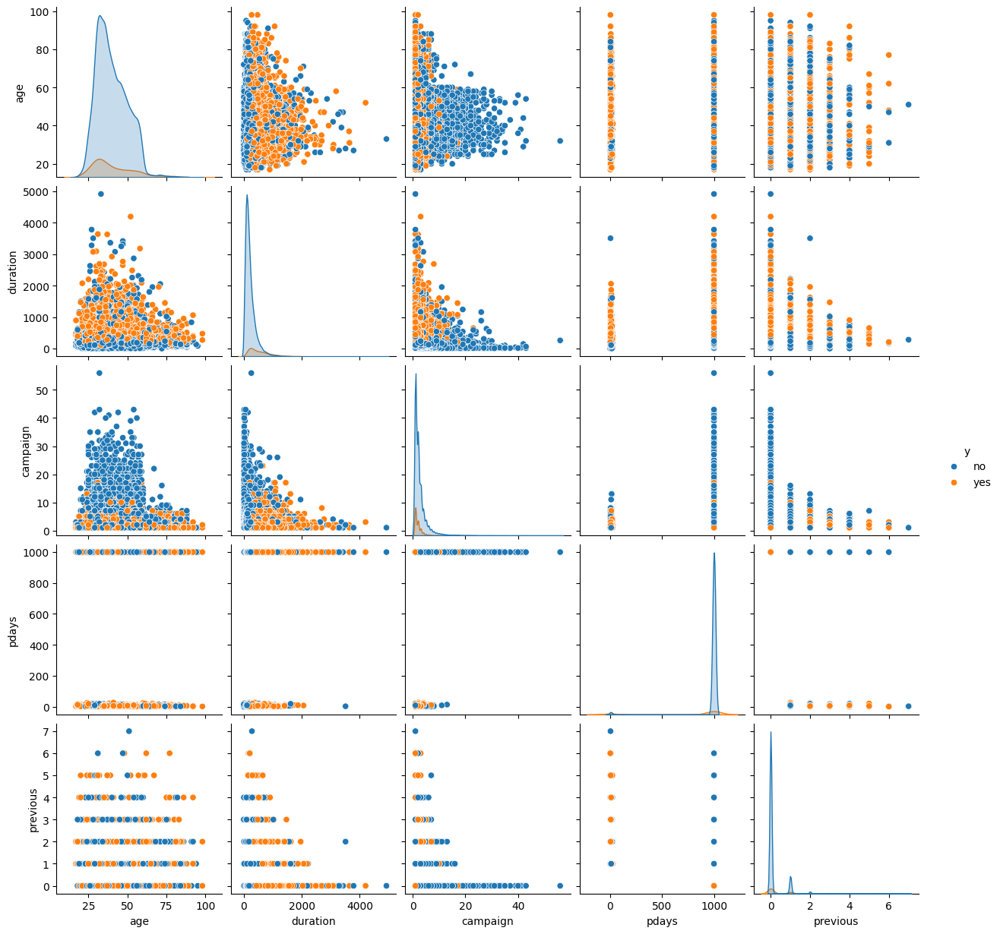

In [23]:

cols = ['age', 'duration', 'campaign', 'pdays', 'previous', 'y']
sns.pairplot(data = df[cols], hue = 'y')

**It can be observed from the data that the customers with age below 60 are contacted more compared to customers with age above 60.**

**Irrespective of age, customers who got converted are contacted less compared to customers who did not.**

In [24]:
# categorical_feats = df.select_dtypes(include= ["object"]).columns
for column in categorical_feats[0:-1]:
  total_counts = df.groupby([column, 'y']).size().reset_index(name='Count')
  total_counts['Percentage'] = total_counts.groupby(column)['Count'].transform(lambda x: x / x.sum() * 100)
  print (total_counts)

  fig = px.histogram(df, x=column, color='y',  barmode='group')
  fig.update_layout(title= column,height=400, width=700)

  fig.show()

              job    y  Count  Percentage
0          admin.   no   9068   87.033305
1          admin.  yes   1351   12.966695
2     blue-collar   no   8614   93.104194
3     blue-collar  yes    638    6.895806
4    entrepreneur   no   1332   91.483516
5    entrepreneur  yes    124    8.516484
6       housemaid   no    954   90.000000
7       housemaid  yes    106   10.000000
8      management   no   2596   88.782490
9      management  yes    328   11.217510
10        retired   no   1284   74.738068
11        retired  yes    434   25.261932
12  self-employed   no   1272   89.514426
13  self-employed  yes    149   10.485574
14       services   no   3644   91.857827
15       services  yes    323    8.142173
16        student   no    600   68.571429
17        student  yes    275   31.428571
18     technician   no   6009   89.167532
19     technician  yes    730   10.832468
20     unemployed   no    870   85.798817
21     unemployed  yes    144   14.201183
22        unknown   no    293   88

    marital    y  Count  Percentage
0  divorced   no   4135   89.676860
1  divorced  yes    476   10.323140
2   married   no  22389   89.843499
3   married  yes   2531   10.156501
4    single   no   9944   85.991007
5    single  yes   1620   14.008993
6   unknown   no     68   85.000000
7   unknown  yes     12   15.000000


              education    y  Count  Percentage
0              basic.4y   no   3748   89.750958
1              basic.4y  yes    428   10.249042
2              basic.6y   no   2103   91.793976
3              basic.6y  yes    188    8.206024
4              basic.9y   no   5571   92.174057
5              basic.9y  yes    473    7.825943
6           high.school   no   8481   89.161060
7           high.school  yes   1031   10.838940
8            illiterate   no     14   77.777778
9            illiterate  yes      4   22.222222
10  professional.course   no   4645   88.645038
11  professional.course  yes    595   11.354962
12    university.degree   no  10495   86.279184
13    university.degree  yes   1669   13.720816
14              unknown   no   1479   85.491329
15              unknown  yes    251   14.508671


   default    y  Count  Percentage
0       no   no  28380   87.119352
1       no  yes   4196   12.880648
2  unknown   no   8153   94.846440
3  unknown  yes    443    5.153560
4      yes   no      3  100.000000


   housing    y  Count  Percentage
0       no   no  16589   89.121092
1       no  yes   2025   10.878908
2  unknown   no    883   89.191919
3  unknown  yes    107   10.808081
4      yes   no  19064   88.377915
5      yes  yes   2507   11.622085


      loan    y  Count  Percentage
0       no   no  30088   88.658396
1       no  yes   3849   11.341604
2  unknown   no    883   89.191919
3  unknown  yes    107   10.808081
4      yes   no   5565   89.068502
5      yes  yes    683   10.931498


     contact    y  Count  Percentage
0   cellular   no  22282   85.260580
1   cellular  yes   3852   14.739420
2  telephone   no  14254   94.767635
3  telephone  yes    787    5.232365


   month    y  Count  Percentage
0    apr   no   2092   79.513493
1    apr  yes    539   20.486507
2    aug   no   5521   89.394430
3    aug  yes    655   10.605570
4    dec   no     93   51.098901
5    dec  yes     89   48.901099
6    jul   no   6521   90.961082
7    jul  yes    648    9.038918
8    jun   no   4759   89.488530
9    jun  yes    559   10.511470
10   mar   no    270   49.450549
11   mar  yes    276   50.549451
12   may   no  12880   93.563853
13   may  yes    886    6.436147
14   nov   no   3684   89.853659
15   nov  yes    416   10.146341
16   oct   no    402   56.066946
17   oct  yes    315   43.933054
18   sep   no    314   55.087719
19   sep  yes    256   44.912281


  day_of_week    y  Count  Percentage
0         fri   no   6980   89.189880
1         fri  yes    846   10.810120
2         mon   no   7665   90.049342
3         mon  yes    847    9.950658
4         thu   no   7574   87.885820
5         thu  yes   1044   12.114180
6         tue   no   7132   88.212740
7         tue  yes    953   11.787260
8         wed   no   7185   88.332924
9         wed  yes    949   11.667076


      poutcome    y  Count  Percentage
0      failure   no   3647   85.771402
1      failure  yes    605   14.228598
2  nonexistent   no  32410   91.167370
3  nonexistent  yes   3140    8.832630
4      success   no    479   34.887109
5      success  yes    894   65.112891


1. Most calls are through cellular contact type.
2. Most calls where made in Q2(April, may , june). But, the best ratio of successful term deposits in terms of the number of customers within a particular month belong to October, September, December, and March.
3. Most calls are made to married people but singles are converted higher in percentage compared to married category

**Checking Correlation of feature variables**


In [25]:
correlation_matrix = df.corr()

# Plot correlation matrix using Plotly
fig = px.imshow(correlation_matrix,
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                color_continuous_scale='Viridis')

# Update the layout for better visibility
fig.update_layout(title='Correlation Matrix',
                  width=600,
                  height=600)

# Show the plot
fig.show()

<ipython-input-25-41fc1d4d7b72>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



**No features are highly correlated, hence all the features can be used for modelling**

**DATA MODELLING**
---

**In this section, 3 ML models are evaluated using different matrices and best performing model is identified. Original imbalanced dataset is used for training and evaluation.**



In [26]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,yes


In [27]:
label_enc = LabelEncoder()
df['job'] = label_enc.fit_transform(df['job'])
df['education'] = label_enc.fit_transform(df['education'])
df['month'] = label_enc.fit_transform(df['month'])
df['y'] = label_enc.fit_transform(df['y'])

In [28]:
df_cat = df.select_dtypes('object')

# One hot encoding
df = pd.get_dummies(df, df_cat.columns, drop_first = True)
df.head()

,age,job,education,month,duration,campaign,pdays,previous,y,marital_married,...,housing_yes,loan_unknown,loan_yes,contact_telephone,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
0,56,3,0,6,261,1,999,0,0,1,...,0,0,0,1,1,0,0,0,1,0
1,57,7,3,6,149,1,999,0,0,1,...,0,0,0,1,1,0,0,0,1,0
2,37,7,3,6,226,1,999,0,0,1,...,1,0,0,1,1,0,0,0,1,0
3,40,0,1,6,151,1,999,0,0,1,...,0,0,0,1,1,0,0,0,1,0
4,56,7,3,6,307,1,999,0,0,1,...,0,0,1,1,1,0,0,0,1,0


In [29]:
# Segregating Features & Labels for Model Training
features = df.drop('y', axis = 1)
target = df['y']

In [30]:
scaler = StandardScaler() # Scaler

In [31]:
LR = LogisticRegression(random_state = 0) # Logistic Regression
rf = RandomForestClassifier(random_state = 0) # Random Forest Classifier
knn = KNeighborsClassifier(n_neighbors=2) # KNN

In [32]:
# Pipelines
logreg_pipe = Pipeline([('scaler',scaler), ('logreg', LR)])
rf_pipe = Pipeline([('scaler',scaler), ('rf', rf)])
knn_pipe = Pipeline([('scaler',scaler) , ('KNN', knn)])



**Training, testing, and comparison of performance metrics across the different models**
---
**Evaluating the models only using accuracy will not be meaningful since the dataset is highly imbalanced.  We note that one of the important metrics that we have to consider here is precision, since we want to reduce the number of clients that will be predicted as people who will pay term deposits but will actually not. This, in turn, will reduce costs for telephonic companies since they can now focus on clients that will actually pay term deposits.**


In [33]:
# Evaluating model in predicting each class using train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.30,
                                                    shuffle = True, stratify = target)



In [34]:
classifiers = [logreg_pipe, rf_pipe, knn_pipe]
classifier_names = ['Logistic Regression', 'Random Forest', 'KNN']

for clf, label in zip(classifiers, classifier_names):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print("For the", label, "model:")
    print(classification_report(y_test, y_pred))
    print("ROC-AUC score: " + "{0:.2%}".format(roc_auc_score(y_test, clf.predict_proba(X_test)[:, 1])))

    print("==========")

For the Logistic Regression model:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     10961
           1       0.67      0.34      0.45      1392

    accuracy                           0.91     12353
   macro avg       0.79      0.66      0.70     12353
weighted avg       0.89      0.91      0.89     12353

ROC-AUC score: 88.85%
For the Random Forest model:
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     10961
           1       0.62      0.37      0.46      1392

    accuracy                           0.90     12353
   macro avg       0.77      0.67      0.71     12353
weighted avg       0.89      0.90      0.89     12353

ROC-AUC score: 91.70%
For the KNN model:
              precision    recall  f1-score   support

           0       0.89      0.99      0.94     10961
           1       0.34      0.02      0.05      1392

    accuracy                           0.88     12353
 

Our model performances are good in terms of accuracy and ROC-AUC score, but really low in the other performance metrics, specifically on the metrics for predicting our minority class (people who will invest term deposits when called by telephone marketing campaigners).

Confirming it through cross-validation:

In [35]:

cv = StratifiedKFold(n_splits=3, shuffle = True, random_state = 0)

In [36]:
# Creating a function that does our cross validation
def cross_validation(classifiers, classifier_names, cv):
    # Arrays to store various metrics
    accs = [] # accuracy
    precs = [] # precision
    recs = [] # recall
    f1s = [] # f1-score
    rocs = [] # roc_auc

    # Zip iterates through both lists simultaneously
    for clf, label in zip(classifiers, classifier_names):

        # Get the cross validated accuracy
        acc = cross_val_score(clf, features, target, cv = cv, scoring='accuracy', n_jobs= -1)
        avg_acc = acc.mean() * 100

        # Get the cross validated precision
        prec = cross_val_score(clf, features, target, cv = cv, scoring='precision', n_jobs= -1)
        avg_prec = prec.mean() * 100

        # Get the cross validated recall
        rec = cross_val_score(clf, features, target, cv = cv, scoring='recall', n_jobs= -1)
        avg_rec = rec.mean() * 100

        # Get the cross validated f1_score
        f1 = cross_val_score(clf, features, target, cv = cv, scoring='f1', n_jobs= -1)
        avg_f1 = f1.mean() * 100

        # Get the cross validated roc_auc
        roc = cross_val_score(clf, features, target, cv = cv, scoring='roc_auc', n_jobs= -1)
        avg_roc = roc.mean() * 100
        # Store scores in an array
        accs.append(float("{:.2f}".format(avg_acc)))
        precs.append(float("{:.2f}".format(avg_prec)))
        recs.append(float("{:.2f}".format(avg_rec)))
        f1s.append(float("{:.2f}".format(avg_f1)))
        rocs.append(float("{:.2f}".format(avg_roc)))
        print(clf)

    # Creating DataFrame to summarize
    data = {'Accuracy': accs,
            'Precision': precs,
            'Recall': recs,
            'F1 Score': f1s,
            'ROC-AUC': rocs}
    df_metrics = pd.DataFrame(data, index = classifier_names)

    return df_metrics

In [37]:
# Performing cross-validation
display(cross_validation(classifiers, classifier_names, cv))

Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg', LogisticRegression(random_state=0))])
Pipeline(steps=[('scaler', StandardScaler()),
                ('rf', RandomForestClassifier(random_state=0))])
Pipeline(steps=[('scaler', StandardScaler()),
                ('KNN', KNeighborsClassifier(n_neighbors=2))])


,Accuracy,Precision,Recall,F1 Score,ROC-AUC
Logistic Regression,90.58,65.90,34.06,44.88,88.87
Random Forest,90.70,64.76,38.31,48.14,91.92
KNN,89.21,56.82,17.68,26.96,72.21


**Summarizing findings:**

---
*   **All machine learning models that tested the data that did not undergo balancing, had > 60% precision but with really low recall scores**.

*   **Our goal is to prioritize precision to have a better score over recall (note that we are considering these metrics when prediciting the minority class)**

*   **Logistic regression found to have a better precision than RF classifier.**
*   **Except precision metrics RF outperforms logistic regression classifier in terms of other evaluation metrices**


---














**With all these observations, the Logistic regression Classifier for the non-balanced dataset (65.90% Precision and 34.06% Recall) produced the highest precision**

In [38]:
LR = LogisticRegression(random_state = 0) # Logistic Regression
rf = RandomForestClassifier(random_state = 0) # Random Forest Classifier


**Additional metrics for the best models produced**

In [39]:
LR_pipeline = Pipeline([('scaler',scaler), ('LR', LR)])
RF_pipeline = Pipeline([('scaler',scaler), ('RF', rf)])

y_pred_lr = cross_val_predict(LR_pipeline, features, target, cv=cv)
y_pred_rf = cross_val_predict(RF_pipeline, features, target, cv=cv)

conf_mat_lr = confusion_matrix(target, y_pred_lr)
conf_mat_rf = confusion_matrix(target, y_pred_rf)




[Text(0, 0.5, 'Unsuccessful'), Text(0, 1.5, 'Successful')]

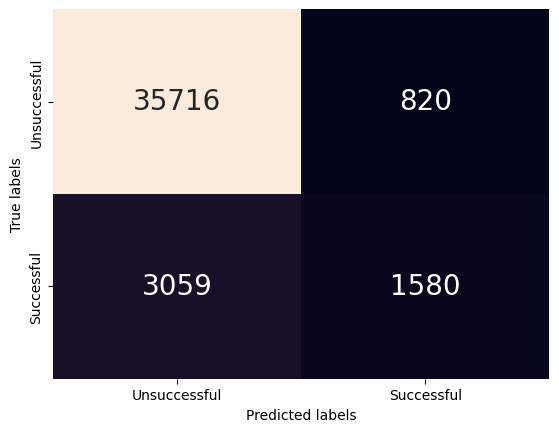

In [40]:
ax = sns.heatmap(conf_mat_lr, cbar = False, fmt = 'g', annot = True, annot_kws={"size":20})
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Unsuccessful', 'Successful'])
ax.yaxis.set_ticklabels(['Unsuccessful', 'Successful'])

[Text(0, 0.5, 'Unsuccessful'), Text(0, 1.5, 'Successful')]

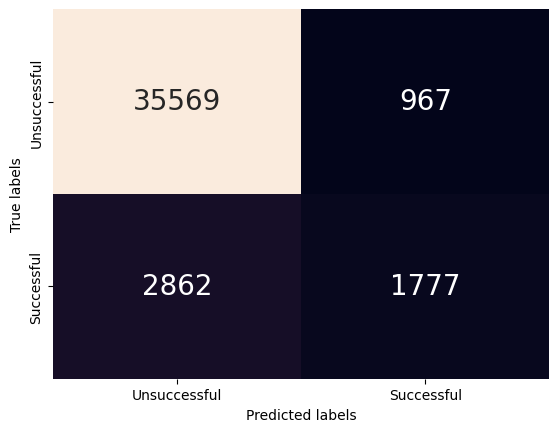

In [41]:
ax = sns.heatmap(conf_mat_rf, cbar = False, fmt = 'g', annot = True, annot_kws={"size":20})
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Unsuccessful', 'Successful'])
ax.yaxis.set_ticklabels(['Unsuccessful', 'Successful'])

In [42]:
fig = go.Figure()
fpr_lr, tpr_lr, _ = roc_curve(target.ravel(), y_pred_lr.ravel())
roc_auc_lr = auc(fpr_lr, tpr_lr)
# Plot the ROC curve
fig.add_trace(go.Scatter(x=fpr_lr, y=tpr_lr, mode='lines', name=f'LR (AUC = {roc_auc_lr:.2f})'))

fpr_rf, tpr_rf, _ = roc_curve(target.ravel(), y_pred_rf.ravel())
roc_auc_rf = auc(fpr_rf, tpr_rf)

fig.add_trace(go.Scatter(x=fpr_rf, y=tpr_rf, mode='lines', name=f'RF (AUC = {roc_auc_rf:.2f})'))


fig.update_layout(
    title='Receiver Operating Characteristic (ROC) Curve',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    legend=dict(x=0, y=1, traceorder='normal'),
    showlegend=True
)


**Feature importances**


<Axes: >

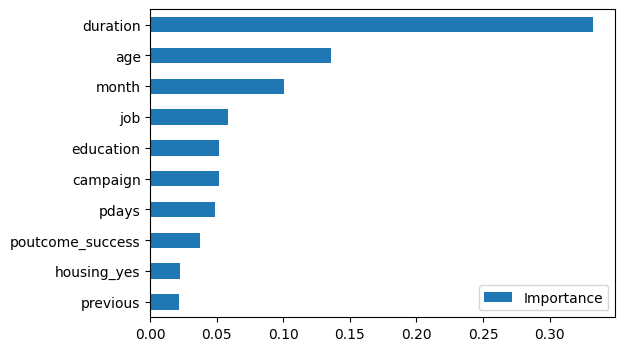

In [43]:
# Extracting the feature importance
clf = RF_pipeline.fit(X_train, y_train)
f_importance = RF_pipeline.steps[1][1].feature_importances_

# Putting into a DataFrame along with corresponding features.
f_list = features.columns
df_feature_importance = pd.DataFrame(f_importance, index=f_list, columns=["Importance"])

# Showing the 10 most important features
df_feature_importance_asc = df_feature_importance.sort_values(["Importance"],ascending=True)[-10:]

#Visualize importance using a plot, values should be ascending for plotting purposes
df_feature_importance_asc.plot(kind='barh', figsize=(6,4))


It can be seen that the main factor in predicing whether a customer will invest a term deposit when called in the current campaign is the duration of the call.

Other two important factors are age and month. From the importance figure, it seems the number of contacts performed before this campaign and for this client (previous) has least importance

**SHAP Summary Plot: Explaining Model Predictions with Feature Importance.**


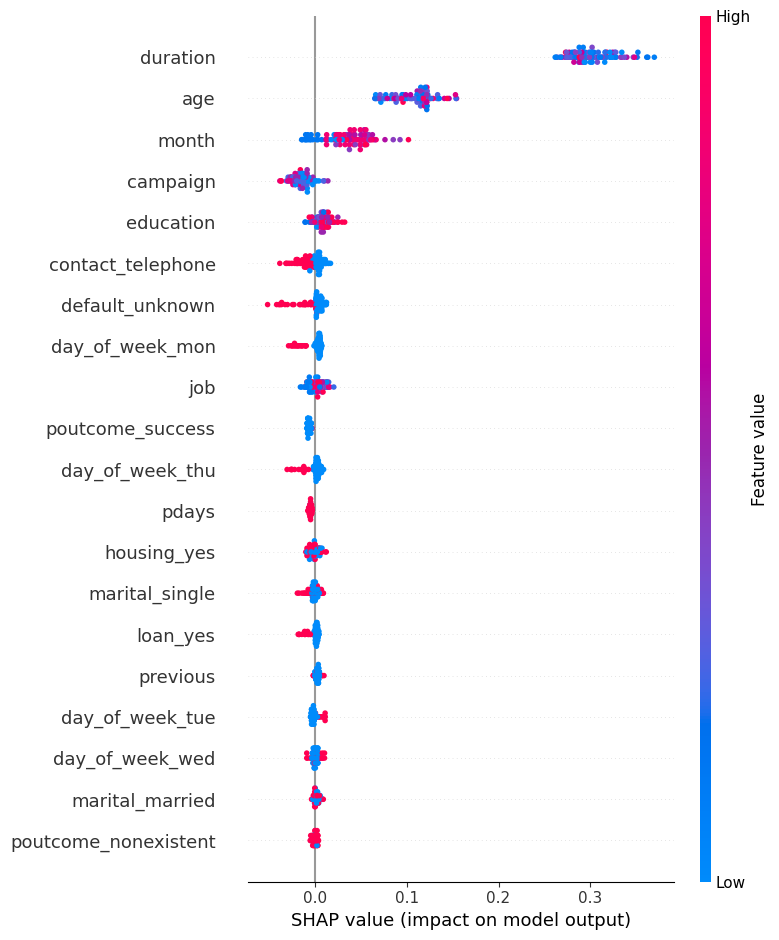

In [44]:
shap_values = shap.TreeExplainer(RF_pipeline.named_steps['RF']).shap_values(X_test[:100])
shap.summary_plot(shap_values[1], X_test[:100], feature_names=X_test.columns)

**Summary**

---
The red color represents high feature values, indicating that the feature positively contributes for increasing the prediction value.
The blue color represents low feature values, indicating that the feature negatively contributes for decreasing the prediction value.

It can be seen that the main factor in predicing whether a client will invest a term deposit when called in the current campaign is the duration of the call for those clients.